# Hampshire Crime Analysis

My local town, Havant is the second safest major town in Hampshire, and is the 30th most dangerous overall out of Hampshire's 268 towns, villages, and cities. The overall crime rate in Havant in 2023 was 93 crimes per 1,000 people. This compares poorly to Hampshire's overall crime rate, coming in 14% higher than the Hampshire rate of 81 per 1,000 daytime population. For England, Wales, and Northern Ireland as a whole, Havant is the 30th safest major town, and the 1,281st most dangerous location out of all towns, cities, and villages.

In January 2024, Havant was the worst major town in Hampshire for drugs, with 35 crimes reported and a crime rate of 0.31 per 1,000 daytime population. January 2024 was also a bad month for Havant residents, when it was Hampshire's most dangerous major town for other crime, recording 14 crimes at a rate of 0.13 per 1,000 daytime population.

The most common crimes in Havant are violence and sexual offences, with 5,092 offences during 2023, giving a crime rate of 46. This is 8% lower than 2022's figure of 5,533 offences and a difference of 3.96 from 2022's crime rate of 50. Havant's least common crime is theft from the person, with 44 offences recorded in 2023, a decrease of 24% from 2022's figure of 58 crimes.

This notebook has a look at the crime stats for all districts in Hampshire as a whole (including 11 districts and two unitary authorities) to see if there are any patterns or interesting insights. We will then home in on Havant to see if we can conclude anything about the crimes reported in this town.

#### Crimes

* Violence and sexual offences - homicide, violence with and without injury, rape and other sexual offences
* Robbery - of business and personal property
* Theft - burglary in dwelling or other building, vehicles, person, bicycle, shoplifting, all others
* Criminal damage and arson
* Drugs - trafficking and possession
* Possession of weapons
* Public order
* Other miscellaneous offences

#### Data Sources:

[Crime Tree](https://assets-hmicfrs.justiceinspectorates.gov.uk/uploads/crime-tree.pdf)

[Hampshire Reported Street Crimes](https://data.police.uk/data/)

[Crime and Safety Havant](https://crimerate.co.uk/hampshire/havant)

[Population - census](https://www.hants.gov.uk/landplanningandenvironment/facts-figures/population/2021-census)

[Economic Indicators](https://www.plumplot.co.uk/Hampshire-salary-and-unemployment.html)


# Import data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from mpl_toolkits.basemap import Basemap
import folium
from folium import plugins
import warnings

In [2]:
warnings.filterwarnings("ignore")

In [56]:
# Set path to get data

path = r'C:\Users\imoge\AllMLProjects\Data\HantsCrime'

all_files = glob.glob(path + "/*.csv")
li = []
for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

In [57]:
# Check we have picked up all the files
len(li)

45

In [58]:
# Concat into a dataframe and get the shape
df = pd.concat(li, axis=0, ignore_index=True)
df.shape

(695422, 12)

In [59]:
df.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,NaN,2021-04,Hampshire Constabulary,Hampshire Constabulary,-1.147727,51.353443,On or near The Beeches,E01022553,Basingstoke and Deane 001A,Anti-social behaviour,NaN,NaN
1,1e89d22ab70b2fca40c73246e918b7768dbbd747aa23c4...,2021-04,Hampshire Constabulary,Hampshire Constabulary,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,NaN
2,9ff12e79f8783d9b1d5384db940203c45b4fb0a0368132...,2021-04,Hampshire Constabulary,Hampshire Constabulary,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,NaN
3,79c56665e645643bdbd3d563b923f51c1fd3ac059a0d9e...,2021-04,Hampshire Constabulary,Hampshire Constabulary,-1.146700,51.353067,On or near Carrington Crescent,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Investigation complete; no suspect identified,NaN
4,cf9c98dd82e6e121c3e255ce7b0d995ebf1062c5623684...,2021-04,Hampshire Constabulary,Hampshire Constabulary,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,NaN


# Data Cleaning

In [60]:
# Check datatypes and null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 695422 entries, 0 to 695421
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Crime ID               612102 non-null  object 
 1   Month                  695422 non-null  object 
 2   Reported by            695422 non-null  object 
 3   Falls within           695422 non-null  object 
 4   Longitude              695422 non-null  float64
 5   Latitude               695422 non-null  float64
 6   Location               695422 non-null  object 
 7   LSOA code              695422 non-null  object 
 8   LSOA name              695422 non-null  object 
 9   Crime type             695422 non-null  object 
 10  Last outcome category  612102 non-null  object 
 11  Context                0 non-null       float64
dtypes: float64(3), object(9)
memory usage: 63.7+ MB


In [61]:
# Check nulls
df.isnull().sum()

Crime ID                  83320
Month                         0
Reported by                   0
Falls within                  0
Longitude                     0
Latitude                      0
Location                      0
LSOA code                     0
LSOA name                     0
Crime type                    0
Last outcome category     83320
Context                  695422
dtype: int64

In [62]:
# What values do we have in this category
df['Last outcome category'].unique()

array([nan, 'Unable to prosecute suspect',
       'Investigation complete; no suspect identified',
       'Status update unavailable', 'Local resolution',
       'Offender given a caution',
       'Further action is not in the public interest',
       'Awaiting court outcome', 'Court result unavailable',
       'Further investigation is not in the public interest',
       'Formal action is not in the public interest',
       'Action to be taken by another organisation',
       'Suspect charged as part of another case', 'Under investigation',
       'Offender given penalty notice'], dtype=object)

It is not entirely clear why there are so many blanks as there is a category for 'under investigation' and it might be assumed that there should be an outcome for all cases

In [63]:
# Lets drop a few columns of no interest
df = df.drop(columns = ['Crime ID','Reported by','Falls within','Context'],axis = 1)

In [64]:
# Change the name of the Month column to date and then replace with a datetime object 
df.rename(columns = {'Month':'Date'},inplace = True)
df['Date'] = pd.to_datetime(df['Date'])

# Extract year, month and day
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Month Name'] = df['Date'].dt.month_name()

# Drop the date column
df.drop(columns = ['Date'],axis = 1, inplace = True)

In [65]:
df.head()

,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Year,Month,Month Name
0,-1.147727,51.353443,On or near The Beeches,E01022553,Basingstoke and Deane 001A,Anti-social behaviour,NaN,2021,4,April
1,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,2021,4,April
2,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,2021,4,April
3,-1.146700,51.353067,On or near Carrington Crescent,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Investigation complete; no suspect identified,2021,4,April
4,-1.147940,51.355909,On or near Bishops Close,E01022553,Basingstoke and Deane 001A,Violence and sexual offences,Unable to prosecute suspect,2021,4,April


In [66]:
df.tail()

,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Year,Month,Month Name
695417,-1.118257,50.872983,On or near Fareham Road,E01034733,Winchester 014F,Violence and sexual offences,Investigation complete; no suspect identified,2024,12,December
695418,-1.043879,50.877416,On or near Plant Farm Crescent,E01034734,Winchester 014G,Anti-social behaviour,NaN,2024,12,December
695419,-1.038213,50.879896,On or near Peasgood Lane,E01034734,Winchester 014G,Burglary,Investigation complete; no suspect identified,2024,12,December
695420,-0.968508,51.361076,On or near Sun Lane,E01016690,Wokingham 017C,Theft from the person,Unable to prosecute suspect,2024,12,December
695421,-0.968508,51.361076,On or near Sun Lane,E01016690,Wokingham 017C,Violence and sexual offences,Unable to prosecute suspect,2024,12,December


We have data from April 2021 through to March 2025, so we have three years of complete data. We will focus in on 2022,2023 and 2024 and drop the rest of the data from the dataset. 

In [67]:
# Get data for 2022 to 2024
df2 = df[(df['Year']==2022) | (df['Year']==2023) | (df['Year']==2024)]
df2.shape

(544313, 10)

In [68]:
# What unique LSOA names do we have?
df2['LSOA name'].unique()

array(['Basingstoke and Deane 001A', 'Basingstoke and Deane 001B',
       'Basingstoke and Deane 001C', ..., 'Central Bedfordshire 009G',
       'Bournemouth, Christchurch and Poole 018C', 'Surrey Heath 009A'],
      dtype=object)

It seems as if we have some LSOA names that are not Hampshire. We are interested in those that relate to Hampshire only. Lets have a look at one of these other ones.

In [69]:
# Check one of them
df2[df2['LSOA name']=='Guildford 004C']

,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Year,Month,Month Name
336435,-0.728433,51.27784,On or near Stratford Road,E01030428,Guildford 004C,Bicycle theft,Investigation complete; no suspect identified,2022,12,December


Lower Layer Super Output Areas (LSOAs): LSOAs have an average population of 1500 people or 650 households. A lot more data is available directly at LSOA level, including the majority of the data included within our tool, Local Insight.

In [70]:
# how many unique codes do we have?
len(list(df2['LSOA code'].unique()))

1347

#### Districts:

* Basingstoke & Deane Borough Council
* East Hampshire District Council
* Eastleigh Borough Council
* Fareham Borough Council
* Gosport Borough Council
* Hart District Council
* Havant Borough Council
* New Forest District Council
* Portsmouth City Council
* Rushmoor Borough Council
* Southampton City Council
* Test Valley Borough Council
* Winchester City Council

We can look up the LSOA codes for each of these from [here](https://geoportal.statistics.gov.uk/datasets/2e39aa3a802d482f8914feee243688f2_0/explore)

In [71]:
# Read in the LSOA code list file
code_list = pd.read_csv(r'C:\Users\imoge\AllMLProjects\Data\LSOAcodes.csv')
code_list.head(2)

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM,LAD22CD,LAD22NM,LAD22NMW,ObjectId
0,E01000155,Barnet 030D,E01033916,Barnet 042B,E09000003,Barnet,NaN,1
1,E01000305,Barnet 036B,E01000305,Barnet 036B,E09000003,Barnet,NaN,2


In [72]:
# Check one of the districts
code_list[code_list['LSOA11NM'].str.contains('Basingstoke')].head()

,LSOA11CD,LSOA11NM,LSOA21CD,LSOA21NM,LAD22CD,LAD22NM,LAD22NMW,ObjectId
21603,E01022552,Basingstoke and Deane 014E,E01022552,Basingstoke and Deane 014E,E07000084,Basingstoke and Deane,NaN,21604
21625,E01022553,Basingstoke and Deane 001A,E01022553,Basingstoke and Deane 001A,E07000084,Basingstoke and Deane,NaN,21626
21630,E01022554,Basingstoke and Deane 001B,E01022554,Basingstoke and Deane 001B,E07000084,Basingstoke and Deane,NaN,21631
21636,E01022555,Basingstoke and Deane 001C,E01022555,Basingstoke and Deane 001C,E07000084,Basingstoke and Deane,NaN,21637
21642,E01022556,Basingstoke and Deane 001D,E01022556,Basingstoke and Deane 001D,E07000084,Basingstoke and Deane,NaN,21643


In [73]:
# Get the codes for each district [We add in a space for Hart so we don't pick up Hartlepool]
basingstoke = list(code_list[code_list['LSOA11NM'].str.contains('Basingstoke')]['LSOA11CD'].unique())
easthants = list(code_list[code_list['LSOA11NM'].str.contains('East Hamp')]['LSOA11CD'].unique())
eastleigh = list(code_list[code_list['LSOA11NM'].str.contains('Eastleigh')]['LSOA11CD'].unique())
fareham = list(code_list[code_list['LSOA11NM'].str.contains('Fareham')]['LSOA11CD'].unique())
gosport = list(code_list[code_list['LSOA11NM'].str.contains('Gosport')]['LSOA11CD'].unique())
havant = list(code_list[code_list['LSOA11NM'].str.contains('Havant')]['LSOA11CD'].unique())
newf = list(code_list[code_list['LSOA11NM'].str.contains('New Forest')]['LSOA11CD'].unique())
ports = list(code_list[code_list['LSOA11NM'].str.contains('Portsmouth')]['LSOA11CD'].unique())
rush = list(code_list[code_list['LSOA11NM'].str.contains('Rushmoor')]['LSOA11CD'].unique())
south = list(code_list[code_list['LSOA11NM'].str.contains('Southampton')]['LSOA11CD'].unique())
test = list(code_list[code_list['LSOA11NM'].str.contains('Test Valley')]['LSOA11CD'].unique())
winch = list(code_list[code_list['LSOA11NM'].str.contains('Winchester')]['LSOA11CD'].unique())
hart = list(code_list[code_list['LSOA11NM'].str.contains('Hart ')]['LSOA11CD'].unique())

# Add them into one list
districts = basingstoke + easthants + eastleigh + fareham + gosport + havant + newf + ports + rush + south + test + winch + hart

In [74]:
# Filter the dataframe against this list to give us just the LSOAs we are interested in
df_filtered = df2[df2['LSOA code'].isin(districts)]
df_filtered.shape

(485398, 10)

In [75]:
df_filtered.head()

,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Year,Month,Month Name
151109,-1.144834,51.353800,On or near Stanfield,E01022553,Basingstoke and Deane 001A,Other theft,Unable to prosecute suspect,2022,1,January
151110,-1.151854,51.357016,On or near Supermarket,E01022554,Basingstoke and Deane 001B,Public order,Local resolution,2022,1,January
151111,-1.153329,51.357269,On or near The Burrows,E01022554,Basingstoke and Deane 001B,Violence and sexual offences,Unable to prosecute suspect,2022,1,January
151112,-1.141741,51.354829,On or near The Parade,E01022555,Basingstoke and Deane 001C,Anti-social behaviour,NaN,2022,1,January
151113,-1.140079,51.350798,On or near Maple Grove,E01022555,Basingstoke and Deane 001C,Anti-social behaviour,NaN,2022,1,January


In [76]:
# Look at one example 
basingstoke

['E01022552',
 'E01022553',
 'E01022554',
 'E01022555',
 'E01022556',
 'E01022557',
 'E01022492',
 'E01022496',
 'E01022497',
 'E01022498',
 'E01022499',
 'E01022500',
 'E01022502',
 'E01022503',
 'E01022504',
 'E01022505',
 'E01022506',
 'E01022507',
 'E01022509',
 'E01022510',
 'E01022511',
 'E01022512',
 'E01022513',
 'E01022514',
 'E01022515',
 'E01022516',
 'E01022517',
 'E01022518',
 'E01022519',
 'E01022520',
 'E01022521',
 'E01022522',
 'E01022523',
 'E01022524',
 'E01022525',
 'E01022526',
 'E01022527',
 'E01022528',
 'E01022529',
 'E01022530',
 'E01022531',
 'E01022532',
 'E01022533',
 'E01022534',
 'E01022535',
 'E01022536',
 'E01022537',
 'E01022539',
 'E01022540',
 'E01022542',
 'E01022543',
 'E01022546',
 'E01022547',
 'E01022548',
 'E01022549',
 'E01022550',
 'E01022551',
 'E01022493',
 'E01022558',
 'E01022494',
 'E01022468',
 'E01022469',
 'E01022495',
 'E01022560',
 'E01022561',
 'E01022562',
 'E01022563',
 'E01022564',
 'E01022565',
 'E01022566',
 'E01022567',
 'E010

In [77]:
# Get a count by district 
pd.DataFrame(df_filtered.groupby('LSOA name')['LSOA name'].count().sort_values(ascending = False))

,LSOA name
LSOA name,
Southampton 023D,4324
Southampton 022F,3598
Portsmouth 027C,3081
Southampton 021C,3003
Portsmouth 013C,2952
...,...
Basingstoke and Deane 021C,63
Basingstoke and Deane 018E,62
East Hampshire 013E,60


Some of the questions/issues we might want to ask/investigate based on the data:

* crimes by location (LSOA area and latitude/longitude
* types of crimes in the county overall and by area
* types of crimes by date of report
* outcomes for crimes for the county and by area

## Total Crimes by Year

In [79]:
df_filtered.groupby('Year',as_index = False)['LSOA code'].count()

,Year,LSOA code
0,2022,182039
1,2023,156878
2,2024,146481


## Types of crimes

In [80]:
# Get unique types of crime
df_filtered['Crime type'].unique()

array(['Other theft', 'Public order', 'Violence and sexual offences',
       'Anti-social behaviour', 'Drugs', 'Shoplifting',
       'Theft from the person', 'Criminal damage and arson',
       'Possession of weapons', 'Burglary', 'Vehicle crime',
       'Other crime', 'Bicycle theft', 'Robbery'], dtype=object)

We have 14 categories of crime which we can consolidate a bit to make analysis easier. 

In [81]:
pd.options.mode.chained_assignment = None

# Combine some categories
df_filtered['Crime type'].replace({'Other theft':'Theft', 
                                   'Bicycle theft':'Theft', 
                                   'Theft from the person':'Theft',
                                   'Public order':'Anti-social & Public Order',
                                   'Anti-social behaviour':'Anti-social & Public Order',
                                   'Robbery':'Burglary & Robbery',
                                   'Burglary':'Burglary & Robbery'},inplace = True)

In [87]:
# Groupby crime type
crimes = df_filtered.groupby(['Crime type'],as_index = False)['Year'].count().sort_values(by = 'Year',ascending = False)
crimes['Average'] = round(crimes['Year']/3,0)
crimes['%'] = round(crimes['Average']/crimes['Average'].sum()*100,1)
crimes

,Crime type,Year,Average,%
9,Violence and sexual offences,194601,64867.0,40.1
0,Anti-social & Public Order,100874,33625.0,20.8
7,Theft,40420,13473.0,8.3
2,Criminal damage and arson,38512,12837.0,7.9
6,Shoplifting,32782,10927.0,6.8
8,Vehicle crime,28088,9363.0,5.8
1,Burglary & Robbery,23864,7955.0,4.9
3,Drugs,13206,4402.0,2.7
4,Other crime,7322,2441.0,1.5
5,Possession of weapons,5729,1910.0,1.2


The most commonly occurring crime is violence and sexual offences
violent and sexual crimes include: domestic abuse, rape, sexual offences, stalking, harassment, so-called 'honour-based' violence including forced marriage, female genital mutilation, child abuse, human trafficking focusing on sexual exploitation, prostitution, pornography and obscenity.

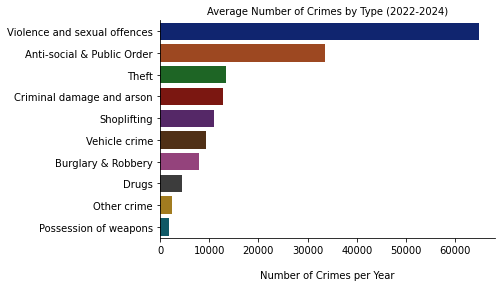

In [88]:
# Plot the crimes across the county for the two year period
ax = sns.barplot(data = crimes, y = 'Crime type', x = 'Average', palette = 'dark')
plt.title('Average Number of Crimes by Type (2022-2024)', fontsize = 10)
plt.ylabel("")
plt.xlabel("Number of Crimes per Year", labelpad = 15)
ax.spines[['right', 'top']].set_visible(False);

We can see that violence is the biggest category by far and possession of weapons is the smallest of the reported crimes

## Types of crimes by year

In [95]:
# Does this vary by year?
crimes_year = df_filtered.groupby(['Year','Crime type'],as_index = False)['Month'].count().pivot(index = 'Crime type',
                                                                                                columns = 'Year',
                                                                                                values = 'Month')
crimes_year['%change period'] = round((crimes_year[2024] -crimes_year[2022])/crimes_year[2022]*100,1)
crimes_year.loc["Total"] = crimes_year.sum()
crimes_year.sort_values(by = '%change period',ascending = False)

Year,2022,2023,2024,%change period
Crime type,,,,
Shoplifting,8632.0,11485.0,12665.0,46.7
Other crime,2446.0,2178.0,2698.0,10.3
Drugs,4348.0,4437.0,4421.0,1.7
Possession of weapons,1979.0,1885.0,1865.0,-5.8
Theft,15194.0,13052.0,12174.0,-19.9
Violence and sexual offences,73700.0,62241.0,58660.0,-20.4
Vehicle crime,10395.0,9543.0,8150.0,-21.6
Criminal damage and arson,14553.0,12661.0,11298.0,-22.4
Burglary & Robbery,9453.0,7520.0,6891.0,-27.1


This table highlights some interesting changes over the period. 

* Crime in total has reduced over the period
* Shoplifting as a crime has seen a large increase in reports whereas all of the other crimes bar drugs and other have reduced over the period.
* This is interesting as anecdotally, shops in my local town have been reporting significant increases in shoplifting, with one shop off-licence locking doors and only opening them when a customer approaches.
* In the nearest city, this increase has been reported in the news and it would be interesting to have a look at which towns and cities are impacted by this the most.

[Portsmouth News Article](https://www.portsmouth.co.uk/news/crime/huge-spike-in-portsmouth-shoplifting-as-reports-to-police-nearly-double-leaving-workers-living-in-fear-4358372)

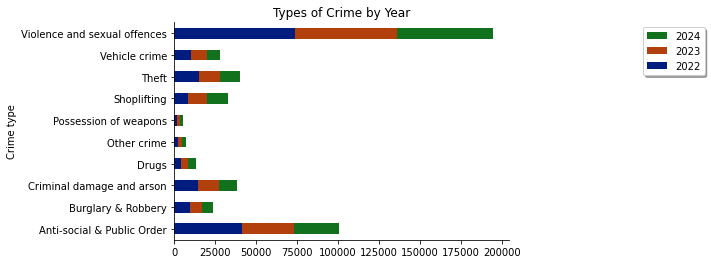

In [103]:
# Plot chart
sns.set_palette('dark')
ax = crimes_year[[2022,2023,2024]][0:-1].plot(kind = 'barh',stacked = True)

# dd titles
plt.title('Types of Crime by Year')
plt.xlabel("")

# Remove frames
ax.spines[['right', 'top']].set_visible(False)

# Legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),loc='upper right', bbox_to_anchor=(1.6, 1),
          ncol=1, fancybox=True, shadow=True);


The proportions of each type of crime per year have remained fairly stable over the period

## Types of crimes by month

Does the pattern of total crime vary by month?

Does the pattern of different types of crime vary by month?

In [105]:
months = list(df_filtered['Month Name'].unique())
crime_month = df_filtered.groupby(['Month'],as_index = False)['Year'].count()
crime_month.index = months
crime_month['Average'] = round(crime_month['Year']/3,1)
crime_month.sort_values(by = 'Average',ascending = False)

,Month,Year,Average
July,7,43863,14621.0
May,5,42868,14289.3
June,6,42395,14131.7
August,8,42282,14094.0
March,3,42250,14083.3
October,10,40639,13546.3
April,4,40444,13481.3
September,9,40093,13364.3
January,1,39669,13223.0
February,2,38413,12804.3


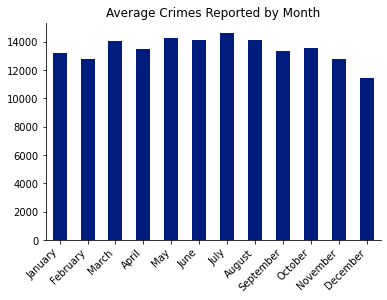

In [106]:
# Plot crimes by month
ax = crime_month['Average'].plot(kind = 'bar')
plt.title('Average Crimes Reported by Month')

# Remove frames
ax.spines[['right', 'top']].set_visible(False)

# Legend
ax.legend_ = None
plt.xticks(rotation=45, ha='right');

There is no significant pattern, other than we can see that total reported crimes are highest in July and lowest in December.

We can see if there are any noticeable patterns with regard to types of crime by month

In [108]:
# Groupby month and type
crime_month_type = df_filtered.groupby(['Month','Crime type'],as_index = False)['Year'].count()
crime_month_type['Average'] = round(crime_month_type['Year']/3,1)
crime_month_type

,Month,Crime type,Year,Average
0,1,Anti-social & Public Order,7416,2472.0
1,1,Burglary & Robbery,2170,723.3
2,1,Criminal damage and arson,3086,1028.7
3,1,Drugs,1123,374.3
4,1,Other crime,599,199.7
...,...,...,...,...
115,12,Possession of weapons,373,124.3
116,12,Shoplifting,2582,860.7
117,12,Theft,3104,1034.7
118,12,Vehicle crime,2115,705.0


In [109]:
# Create pivot table
crime_month_type = crime_month_type.pivot(index = 'Month', columns = 'Crime type', values = 'Average')
crime_month_type.index = months
crime_month_type

Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences
January,2472.0,723.3,1028.7,374.3,199.7,142.7,830.7,1029.0,887.3,5535.3
February,2504.0,661.3,1054.7,344.3,197.3,152.0,833.0,1055.7,763.0,5239.0
March,2839.0,695.7,1128.7,377.3,219.3,170.3,917.7,1143.7,755.0,5836.7
April,2954.3,649.7,1126.0,337.7,192.0,153.7,941.7,1094.7,763.3,5268.3
May,3324.7,605.7,1149.0,400.3,212.7,186.0,894.7,1137.3,693.7,5685.3
June,3243.0,612.0,1100.0,350.0,209.7,168.7,894.0,1133.3,757.7,5663.3
July,3460.0,639.7,1101.0,377.7,229.0,166.3,1002.3,1191.3,755.7,5698.0
August,3287.3,665.7,1082.0,376.7,182.3,168.7,1001.3,1225.3,813.7,5291.0
September,2722.0,722.7,998.3,341.3,200.7,166.7,886.3,1139.0,792.3,5395.0
October,2715.7,690.7,1097.7,382.0,208.3,169.3,912.0,1163.3,884.3,5323.0


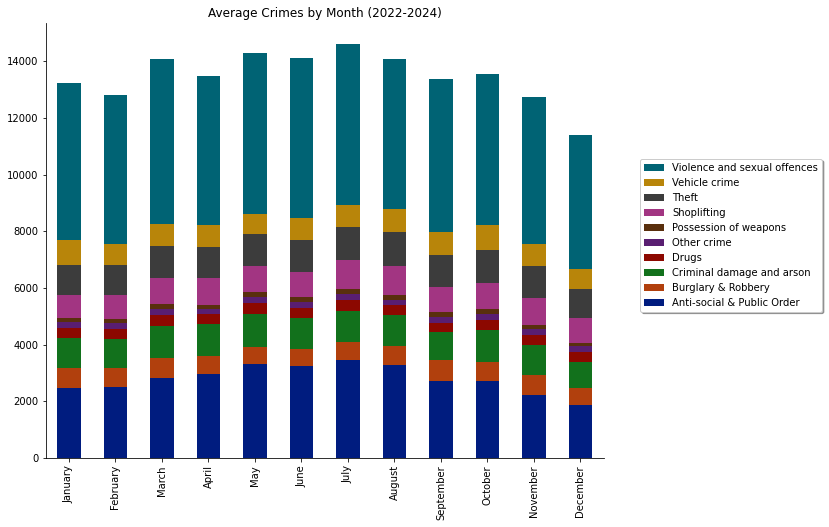

In [110]:
# Plot the data
sns.set_palette('dark')

# Plot
fig, ax = plt.subplots(figsize = (10,8))
crime_month_type.plot(ax = ax, kind = 'bar',stacked = True)

# Title
plt.title("Average Crimes by Month (2022-2024)")

# Remove frames
ax.spines[['right', 'top']].set_visible(False)

# Legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),loc='upper right', bbox_to_anchor=(1.4, 0.7),
          ncol=1, fancybox=True, shadow=True);


* We can see an increase in anti-social and public order offences reported during the summer months which declines over the year
* Violence and sexual offences also reduce

We can see this a little better if we plot each of these crime types separately

In [111]:
def plot_line_charts(df):
    
    columns = df.columns[:10]  # Select the first 10 columns from the dataframe
    
    for column in columns:
        plt.figure(figsize = (15,4))
        plt.plot(df.index, df[column])
        plt.title(f" {column}")
        plt.xlabel("Months", labelpad = 10)
        plt.ylabel("Average Number", labelpad = 10)
        plt.show()


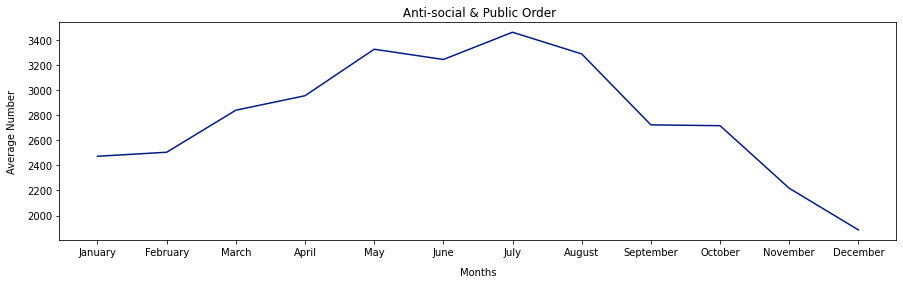

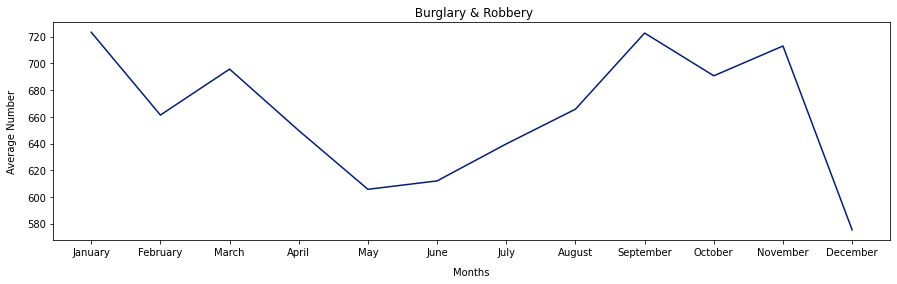

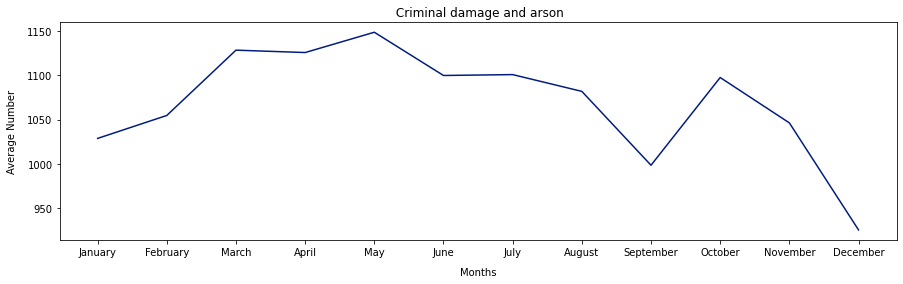

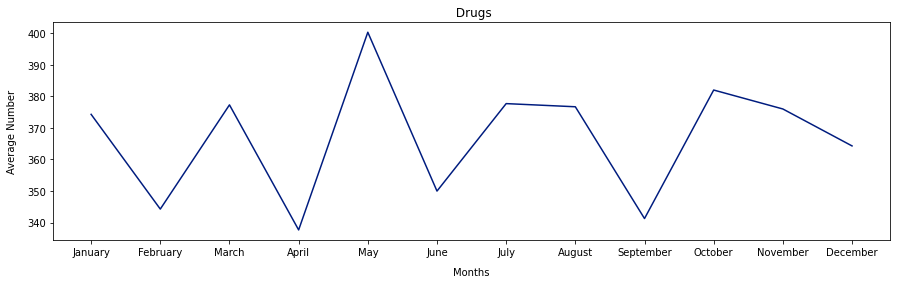

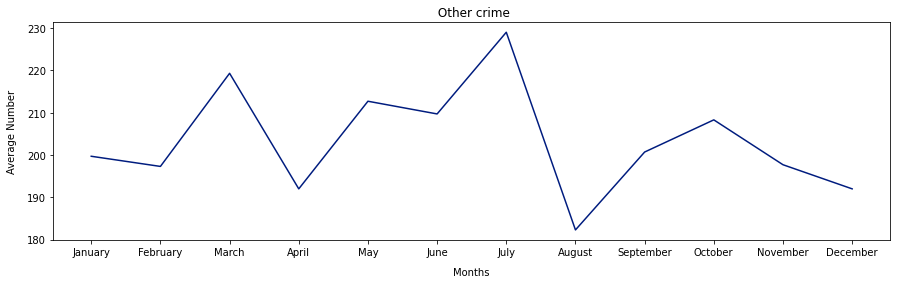

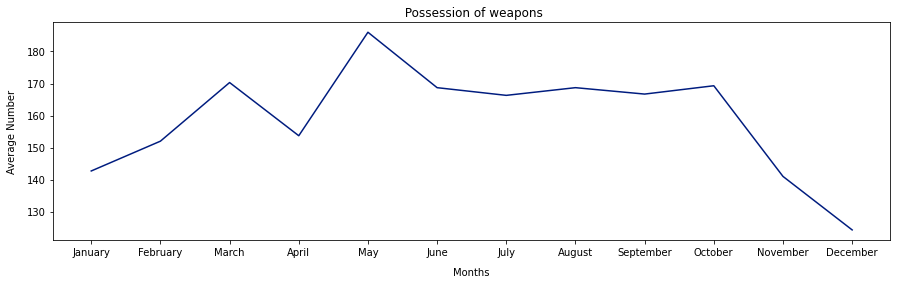

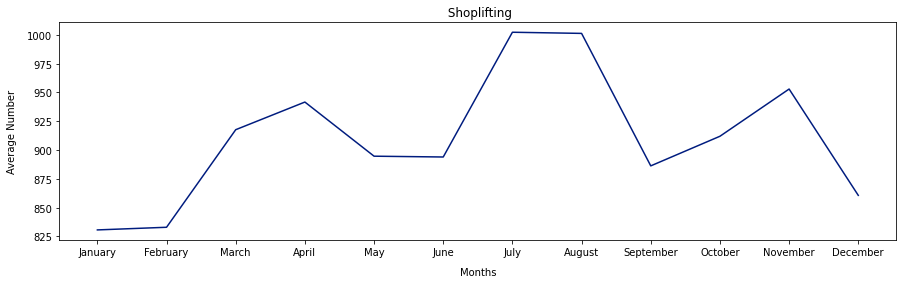

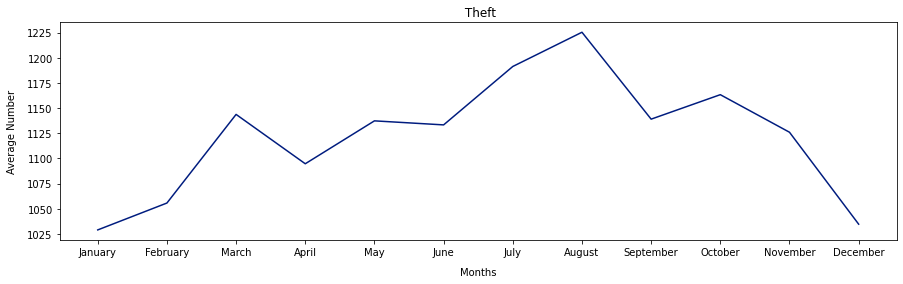

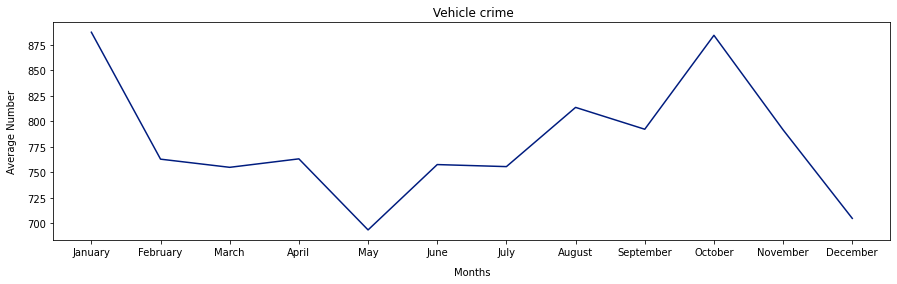

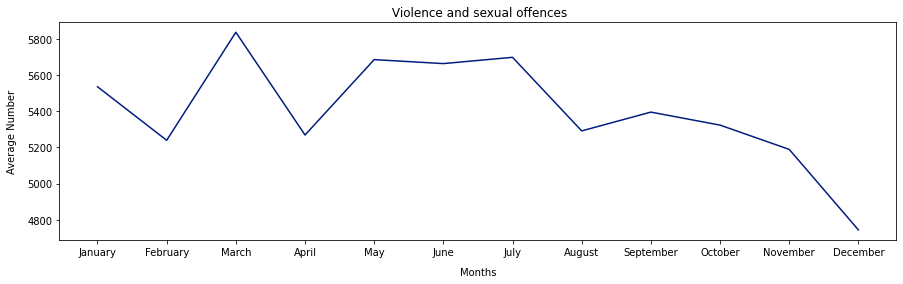

In [112]:
plot_line_charts(crime_month_type)

#### Pattern of crimes by month:

* Anti-social and public order increases over the summer and then decreases into the winter. This might align with protests and riots occurring over the better summer weather, increased drinking out of the home over the summer etc.
* Burglary & Robbery hits a low point in May and then increases gradually over the rest of the year to a peak in November prior to the Christmas period
* Criminal damage and arson is highest in May as the weather increases with another peak in October. These might coincide with holiday periods.
* Drugs crime has a distinct cyclical pattern peaking in March, May, August and October, possibly in line with school holidays
* Other crime - significant dip in August
* Possession of weapons has similar peaks as drug crime but without the dips, again indicating possible association with drug crime
* Shoplifting has peaks in April, over the summer and a smaller increase in November. Some of this might be associated with school holidays at Easter, Summer and prior to Christmas.
* Theft increases in March and then remains high over the summer and autumn only dipping in December. 
* Vehicle crime is at a peak in October and much lower over the summer, which might be related to break-ins to steal items bought for Christmas and left in the car or possibly theft of the new cars released in September.
* Violence and sexual offences appear to peak in March and then decline over the rest of the year.

## Crimes by district

To analyse the crimes by district, we can filter by the LSOA codes we used earlier.

In [113]:
# Add a district column
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Basingstoke')), 'District'] = 'Basingstoke' 
df_filtered.loc[(df_filtered['LSOA name'].str.contains('East Hamp')), 'District'] = 'East Hampshire'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Eastleigh')), 'District'] = 'Eastleigh'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Fareham')), 'District'] = 'Fareham'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Gosport')), 'District'] = 'Gosport'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Havant')), 'District'] = 'Havant'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('New Forest')), 'District'] = 'New Forest'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Portsmouth')), 'District'] = 'Portsmouth'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Rushmoor')), 'District'] = 'Rushmoor'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Southampton')), 'District'] = 'Southampton'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Test Valley')), 'District'] = 'Test Valley'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Winchester')), 'District'] = 'Winchester'
df_filtered.loc[(df_filtered['LSOA name'].str.contains('Hart ')), 'District'] = 'Hart'

In [114]:
df_filtered.head()

,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Year,Month,Month Name,District
151109,-1.144834,51.353800,On or near Stanfield,E01022553,Basingstoke and Deane 001A,Theft,Unable to prosecute suspect,2022,1,January,Basingstoke
151110,-1.151854,51.357016,On or near Supermarket,E01022554,Basingstoke and Deane 001B,Anti-social & Public Order,Local resolution,2022,1,January,Basingstoke
151111,-1.153329,51.357269,On or near The Burrows,E01022554,Basingstoke and Deane 001B,Violence and sexual offences,Unable to prosecute suspect,2022,1,January,Basingstoke
151112,-1.141741,51.354829,On or near The Parade,E01022555,Basingstoke and Deane 001C,Anti-social & Public Order,NaN,2022,1,January,Basingstoke
151113,-1.140079,51.350798,On or near Maple Grove,E01022555,Basingstoke and Deane 001C,Anti-social & Public Order,NaN,2022,1,January,Basingstoke


In [115]:
# Total crime 2022 and 2023 by District
pd.DataFrame(df_filtered.groupby('District')['District'].count().sort_values(ascending = False))

,District
District,
Southampton,102046
Portsmouth,86994
Basingstoke,39300
New Forest,37164
Havant,33728
Eastleigh,27650
Rushmoor,26965
Winchester,26404
Test Valley,25432


In [117]:
# Crimes by district in total for 2022 and 2023
crime_district = df_filtered.groupby(['District','Crime type'],as_index = False)['Month'].count()
crime_district.columns = ['District','Crime type','Total']
crime_district['Average'] = round(crime_district['Total']/3,1)
crime_district

,District,Crime type,Total,Average
0,Basingstoke,Anti-social & Public Order,8589,2863.0
1,Basingstoke,Burglary & Robbery,1989,663.0
2,Basingstoke,Criminal damage and arson,3324,1108.0
3,Basingstoke,Drugs,974,324.7
4,Basingstoke,Other crime,686,228.7
...,...,...,...,...
125,Winchester,Possession of weapons,225,75.0
126,Winchester,Shoplifting,1696,565.3
127,Winchester,Theft,2465,821.7
128,Winchester,Vehicle crime,1706,568.7


In [118]:
crime_district_pivot = crime_district.pivot(index = 'District',columns = 'Crime type',values = 'Average')
crime_district_pivot = crime_district_pivot.sort_index()
crime_district_pivot['Total Average'] = crime_district_pivot.iloc[:, 0:].sum(axis=1)
crime_district_pivot

Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average
District,,,,,,,,,,,
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7
Fareham,1624.7,277.7,511.0,137.7,115.7,66.3,551.0,587.3,342.0,2857.7,7071.1
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7
Hart,1055.7,254.3,412.0,99.0,82.7,41.0,224.0,454.3,327.0,1798.3,4748.3
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2


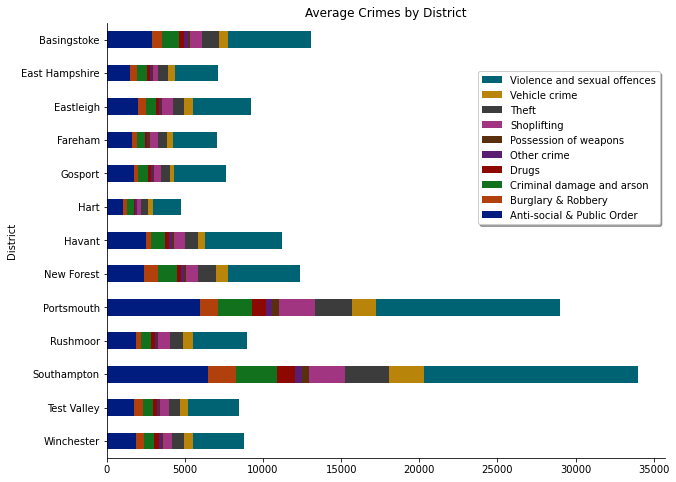

In [119]:
df.iloc[1:3, :]

# Plot the data
fig, ax = plt.subplots(figsize = (10,8))
crime_district_pivot.iloc[:,0:-1].plot(ax = ax, kind = 'barh', stacked = True)

# Title
plt.title("Average Crimes by District")

# Remove frames
ax.spines[['right', 'top']].set_visible(False)

ax.invert_yaxis()

# Legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),loc='upper right', bbox_to_anchor=(1.0, 0.9),
          ncol=1, fancybox=True, shadow=True);

We can see that the largest offences are reported in the two largest towns/cities in Hampshire, Portsmouth and Southampton with violence and sexual offences being the largest category. The lowest number of crimes is reported in Hart, a rural district.

In [120]:
# Add total crimes by district column
#crime_district_pivot['Total']=crime_district_pivot.sum(axis = 1)

# Add the population from the 2021 census for each district

crime_district_pivot.insert(11, "Pop", [185200,125700,136400,114500,
                                       81900,99400,124200,175800,
                                       208100,99800,249000,130500,127500],True)


In [121]:
# Add crimes per head and sort by crimes per 000 population
crime_district_pivot['Crimes per 000 Pop'] = round(crime_district_pivot['Total Average']/crime_district_pivot['Pop']*1000,1)

crime_district_pivot.sort_values(by = 'Crimes per 000 Pop',ascending = False)

Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,81900,93.4
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6


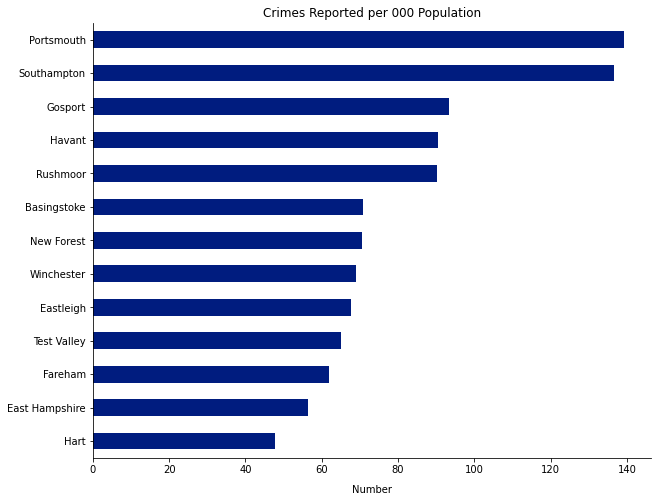

In [122]:
# Plot the data
fig, ax = plt.subplots(figsize = (10,8))
crime_district_pivot['Crimes per 000 Pop'].sort_values(ascending = False).plot(ax = ax, kind = 'barh')

ax.invert_yaxis()
plt.title('Crimes Reported per 000 Population')
plt.xlabel('Number', labelpad = 10)
plt.ylabel("")

# Remove frames
ax.spines[['right', 'top']].set_visible(False)

* On average Southampton has just over 36000 crimes reported per year. When expressed per head of population, this equates to 140 crimes per 000 population of which 40% is violent and sexual offences. 
* For Portsmouth, the picture is similar with a slightly lower number of crimes with a smaller population resulting in 140 reported crimes per 000 population.
* The lowest reported crimes per head is in the district of Hart at just under 50 crimes per 000 population
* It appears that the two largest connurbations also have the highest crime levels per head

## Relationship between crimes

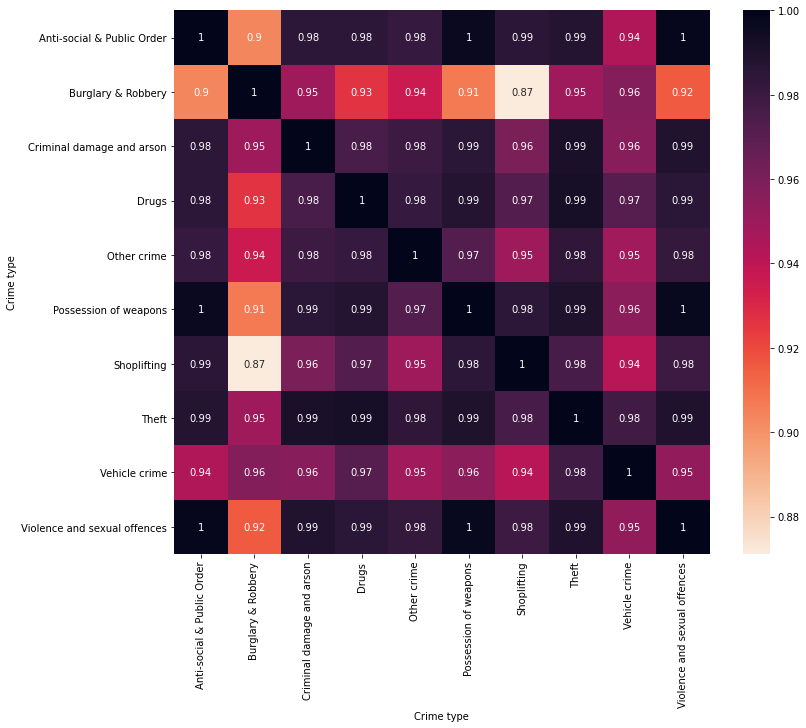

In [123]:
crime_corr = crime_district_pivot.iloc[:,0:10].corr()

# Lets look at a heatmap
cmap = sns.cm.rocket_r
fig, ax = plt.subplots(figsize = (12,10))
sns.heatmap(crime_corr, annot = True, cmap = cmap);

There is pretty strong correlation between different types of crime being reported in a district. This is what we might expect. For example drugs offences are highly positively correlated with theft, violence, possession of weapons and anti-social behaviour. Shoplifting and burglary are less highly correlated.

## What are the hotspots for particular crimes?

Look at the top three districts for each type of crime reported. We might expect Southampton, Portsmouth and Basingstoke to be the highest on all crimes but there may be some differences in the results.

In [125]:
# Sort the table by each crime in descending order and take the top 3
for i in crime_district_pivot.columns[0:10]:
    r = crime_district_pivot.sort_values(by = i,ascending = False).head(10)
    print(i)
    display(r)

Anti-social & Public Order


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0


Burglary & Robbery


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6,125700,56.5
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5


Criminal damage and arson


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,81900,93.4
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1


Drugs


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6,125700,56.5


Other crime


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1


Possession of weapons


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,81900,93.4
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0


Shoplifting


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Fareham,1624.7,277.7,511.0,137.7,115.7,66.3,551.0,587.3,342.0,2857.7,7071.1,114500,61.8


Theft


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0


Vehicle crime


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,8801.3,127500,69.0
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6,125700,56.5


Violence and sexual offences


Crime type,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop
District,,,,,,,,,,,,,
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,34015.3,249000,136.6
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,208100,139.3
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,124200,90.5
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,175800,70.5
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6
Rushmoor,1858.7,340.0,629.7,232.3,125.3,98.7,775.3,792.3,695.0,3441.0,8988.3,99800,90.1
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,81900,93.4
Test Valley,1748.3,592.3,623.7,233.0,135.0,80.3,539.7,707.7,511.3,3306.0,8477.3,130500,65.0


#### Crime categories where other districts feature

* Theft and vehicle crime - New Forest 3rd place
* Shoplifting - Rushmoor 3rd place

The New Forest is an area that receives a lot of visitors and there are a lot of expensive homes in this district too. This could explain it being a hotspot for these types of crimes

Rushmoor encompasses the towns of Farnborough and Aldershot, both military areas but it is not clear why it appears in third place for shoplifting

Lets plot this on a map. We are using the full dataframe here with latitude and longitude and crimes cover the two year period of 2022 and 2023.

In [130]:
# Map these crimes on a map of England and Wales (2022 and 2023)

lat = df_filtered['Latitude'].to_list()
long = df_filtered['Longitude'].to_list()

crime_map = folium.Map([50.9, -1.08], zoom_start=8.5)

heatmap = plugins.HeatMap(list(zip(lat,long)),radius = 2, blur = 1)
crime_map.add_child(heatmap)

We can clearly see the hotspots in Hampshire on the map and these are clustered around the major connurbations as we might expect

In [134]:
# Lets have a closer look at Havant (2022 and 2023)

hav = df_filtered[df_filtered['District']=='Havant']

# Map these crimes on a map of England and Wales

lat = hav['Latitude'].to_list()
long = hav['Longitude'].to_list()

crime_map = folium.Map([50.9, -0.95], zoom_start=12)

heatmap = plugins.HeatMap(list(zip(lat,long)),radius = 3, blur = 1)
crime_map.add_child(heatmap)

There are some hotspot areas in the Havant district that we can narrow down to locations

In [135]:
hav.groupby(['LSOA code'], as_index = False)['Year'].count().sort_values(by = 'Year', ascending = False).head()

,LSOA code,Year
71,E01022973,1849
6,E01022905,1410
4,E01022903,1295
51,E01022953,1172
15,E01022915,986


There are a couple of locations of interest

In [136]:
# Look at the first location -crimes over the two year period
hav[hav['LSOA code']=='E01022973'].groupby('Crime type',as_index = False)['Year'].count().sort_values(by = 'Year', ascending = False)

,Crime type,Year
9,Violence and sexual offences,507
0,Anti-social & Public Order,489
6,Shoplifting,457
7,Theft,156
2,Criminal damage and arson,95
1,Burglary & Robbery,59
3,Drugs,34
5,Possession of weapons,25
8,Vehicle crime,20
4,Other crime,7


We can see that most of these involve violence and sexual offences, followed by anti-social and public order and shoplifting. We could try to narrow this down a little more.

In [137]:
# Lets have a closer look at Havant (2022 and 2023)

E01022973 = hav[hav['LSOA code']=='E01022973']

# Map these crimes on a map of England and Wales

lat = E01022973['Latitude'].to_list()
long = E01022973['Longitude'].to_list()

crime_map = folium.Map([50.88, -1.02], zoom_start=15)

heatmap = plugins.HeatMap(list(zip(lat,long)),radius = 10, blur = 1)
crime_map.add_child(heatmap)

This LSOA is actually in Waterlooville, a nearby town to Havant but in the Havant and Waterlooville District

In [138]:
# Look at the first location -crimes over the two year period
E01022973.groupby('Location',as_index = False)['Year'].count().sort_values(by = 'Year', ascending = False).head()

,Location,Year
25,On or near Supermarket,308
0,On or near,281
2,On or near Aysgarth Road,172
17,On or near Parking Area,167
26,On or near Swiss Road,153


This first line doesn't provide much information, although we can see a couple of locations of interest which are around the central town shopping area

In [139]:
# Look at the other LSOA
hav[hav['LSOA code']=='E01022953'].groupby('Crime type',as_index = False)['Year'].count().sort_values(by = 'Year', ascending = False)

,Crime type,Year
0,Anti-social & Public Order,338
9,Violence and sexual offences,321
6,Shoplifting,222
7,Theft,115
2,Criminal damage and arson,69
1,Burglary & Robbery,40
8,Vehicle crime,30
3,Drugs,22
5,Possession of weapons,12
4,Other crime,3


In this area, anti-social and public order offences are the top reported crime. Again, violence and shoplifting are also top reported crimes for this LSOA.

In [140]:
# Lets have a closer look at Havant (2022 and 2023)

E01022953 = hav[hav['LSOA code']=='E01022953']

# Map these crimes on a map of England and Wales

lat = E01022953['Latitude'].to_list()
long = E01022953['Longitude'].to_list()

crime_map = folium.Map([50.8518, -0.98], zoom_start=15)

heatmap = plugins.HeatMap(list(zip(lat,long)),radius = 10, blur = 1)
crime_map.add_child(heatmap)

In [141]:
# Look at the first location -crimes over the two year period
E01022953.groupby('Location',as_index = False)['Year'].count().sort_values(by = 'Year', ascending = False).head()

,Location,Year
0,On or near,366
31,On or near Shopping Area,70
5,On or near Bulbeck Road,68
18,On or near Market Parade,67
6,On or near Bus/Coach Station,65


As before, there is not much information regarding the location name but we can see from the map the hotpspot areas which are again focussed primarily on the shopping centre areas

## Economic Indicators

It might be interesting to have a look at some other economic indicators such as unemployment rates, median incomes or education to try to build up a picture by district and see if there are any obvious links between crime rate and other factors. From this we might be able to build up a model.

We will look at:

* Unemployment figures
* Median household income
* Population density

These are the latest available from [this link](https://www.plumplot.co.uk/Hampshire-salary-and-unemployment.html)

In [152]:
# Read in some other indicators
eco = pd.read_csv(r'C:\Users\imoge\AllMLProjects\Data\EconomicHants.csv')
eco

,Unnamed: 0,med_salary,unemp_rate,Land_area
0,Basingstoke,41100,3.5,633.80
1,East Hampshire,34500,3.3,514.40
2,Eastleigh,36500,2.9,80.00
3,Fareham,39200,2.7,74.20
4,Gosport,36000,3.1,25.29
5,Hart,39500,2.5,215.30
6,Havant,35700,5.1,55.30
7,New Forest,33400,3.1,753.20
8,Portsmouth,38700,4.7,40.25
9,Rushmoor,41400,2.8,39.00


In [153]:
# Drop the last few rows
eco = eco.iloc[0:13,:]

# Rename the first column
eco.rename(columns = {'Unnamed: 0':'District Name'}, inplace = True)

In [154]:
# Check the datatypes
eco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   District Name  13 non-null     object 
 1   med_salary     13 non-null     int64  
 2   unemp_rate     13 non-null     float64
 3   Land_area      13 non-null     float64
dtypes: float64(2), int64(1), object(1)
memory usage: 544.0+ bytes


In [155]:
eco

,District Name,med_salary,unemp_rate,Land_area
0,Basingstoke,41100,3.5,633.80
1,East Hampshire,34500,3.3,514.40
2,Eastleigh,36500,2.9,80.00
3,Fareham,39200,2.7,74.20
4,Gosport,36000,3.1,25.29
5,Hart,39500,2.5,215.30
6,Havant,35700,5.1,55.30
7,New Forest,33400,3.1,753.20
8,Portsmouth,38700,4.7,40.25
9,Rushmoor,41400,2.8,39.00


In [156]:
# Merge with the economic indicators
crime_district_all = crime_district_pivot.merge(eco, left_on = 'District', right_on = 'District Name')

In [157]:
# Add column for population density
crime_district_all['Pop_density']= crime_district_all['Pop']/crime_district_all['Land_area']

In [158]:
# Set the names of districts as index
crime_district_all.set_index('District Name', inplace = True)

In [159]:
crime_district_all.head()

,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Pop,Crimes per 000 Pop,med_salary,unemp_rate,Land_area,Pop_density
District Name,,,,,,,,,,,,,,,,,
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,185200,70.7,41100,3.5,633.80,292.205743
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6,125700,56.5,34500,3.3,514.40,244.362364
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,136400,67.6,36500,2.9,80.00,1705.000000
Fareham,1624.7,277.7,511.0,137.7,115.7,66.3,551.0,587.3,342.0,2857.7,7071.1,114500,61.8,39200,2.7,74.20,1543.126685
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,81900,93.4,36000,3.1,25.29,3238.434164


In [160]:
# Drop columns not wanted
crime_district_all.drop(columns = ['Land_area','Pop'],axis = 1, inplace = True)

In [161]:
# Check head
crime_district_all

,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Total Average,Crimes per 000 Pop,med_salary,unemp_rate,Pop_density
District Name,,,,,,,,,,,,,,,
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,13100.1,70.7,41100,3.5,292.205743
East Hampshire,1509.0,448.0,626.3,171.7,114.0,65.0,347.3,641.0,463.0,2714.3,7099.6,56.5,34500,3.3,244.362364
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,9216.7,67.6,36500,2.9,1705.000000
Fareham,1624.7,277.7,511.0,137.7,115.7,66.3,551.0,587.3,342.0,2857.7,7071.1,61.8,39200,2.7,1543.126685
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,7652.7,93.4,36000,3.1,3238.434164
Hart,1055.7,254.3,412.0,99.0,82.7,41.0,224.0,454.3,327.0,1798.3,4748.3,47.8,39500,2.5,461.681375
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,11242.6,90.5,35700,5.1,2245.931284
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,12387.9,70.5,33400,3.1,233.404142
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,28998.2,139.3,38700,4.7,5170.186335


Lets try clustering on this data

In [164]:
# Create new dataframe, drop the total column and shuffle
df_cluster = crime_district_all.drop(columns = ['Total Average'],axis = 1).sample(frac = 1)
df_cluster

,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Crimes per 000 Pop,med_salary,unemp_rate,Pop_density
District Name,,,,,,,,,,,,,,
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,93.4,36000,3.1,3238.434164
Hart,1055.7,254.3,412.0,99.0,82.7,41.0,224.0,454.3,327.0,1798.3,47.8,39500,2.5,461.681375
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,70.7,41100,3.5,292.205743
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,139.3,38700,4.7,5170.186335
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,136.6,37000,5.2,3420.329670
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,67.6,36500,2.9,1705.000000
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,69.0,38500,2.7,192.898316
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,90.5,35700,5.1,2245.931284
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,70.5,33400,3.1,233.404142


In [165]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [166]:
object = StandardScaler()
standard = object.fit_transform(df_cluster)
standard

array([[-5.17088363e-01, -8.37512854e-01, -5.26393733e-01,
        -5.73003154e-01, -6.73791782e-01, -4.44832496e-01,
        -6.25928434e-01, -6.72680684e-01, -8.21186713e-01,
        -4.78032990e-01,  4.38033915e-01, -6.78488135e-01,
        -3.03707496e-01,  1.03066435e+00],
       [-9.44005981e-01, -8.54234812e-01, -8.78602967e-01,
        -8.12835204e-01, -1.00043209e+00, -7.95739212e-01,
        -9.61063099e-01, -8.44982252e-01, -7.22027316e-01,
        -9.25483468e-01, -1.23292171e+00,  8.27424555e-01,
        -9.43955729e-01, -7.76689826e-01],
       [ 1.70493817e-01,  1.22088672e-01,  1.83978855e-01,
        -4.72044585e-02,  3.89931904e-01,  2.10393748e-02,
        -1.56739904e-01,  5.84760099e-02, -2.66077716e-01,
         1.10554330e-01, -3.93779523e-01,  1.51584179e+00,
         1.23124660e-01, -8.86999427e-01],
       [ 2.10170558e+00,  1.19635505e+00,  1.85830857e+00,
         1.93149476e+00,  1.72315765e+00,  2.07237842e+00,
         2.32169784e+00,  1.91111704e+00,  1.

In [167]:
# Run kmeans with 2 clusters
kmeans = KMeans(n_clusters = 2, random_state = 42)
mod = kmeans.fit_predict(standard)
mod1 = mod+1
mod1

array([1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1])

In [276]:
# Create cluster column
cluster = list(mod1)
df_cluster['Cluster']=cluster

# show dataframe
pd.set_option("display.max_rows",None,"display.max_columns", None)
df_cluster

,Anti-social & Public Order,Burglary & Robbery,Criminal damage and arson,Drugs,Other crime,Possession of weapons,Shoplifting,Theft,Vehicle crime,Violence and sexual offences,Crimes per 000 Pop,med_salary,unemp_rate,Pop_density,Cluster
District Name,,,,,,,,,,,,,,,
Gosport,1748.0,261.3,642.7,169.7,117.0,87.7,439.0,573.0,273.0,3341.3,93.4,36000,3.1,3238.434164,1
Hart,1055.7,254.3,412.0,99.0,82.7,41.0,224.0,454.3,327.0,1798.3,47.8,39500,2.5,461.681375,1
Basingstoke,2863.0,663.0,1108.0,324.7,228.7,149.7,740.0,1076.7,575.3,5371.0,70.7,41100,3.5,292.205743,1
Portsmouth,5994.7,1112.7,2204.7,908.0,368.7,422.7,2330.0,2353.0,1542.0,11761.7,139.3,38700,4.7,5170.186335,2
Southampton,6489.0,1784.3,2642.7,1106.3,458.7,478.3,2266.3,2811.0,2275.7,13703.0,136.6,37000,5.2,3420.329670,2
Eastleigh,2001.3,484.0,682.7,169.0,142.0,84.0,672.7,728.0,577.0,3676.0,67.6,36500,2.9,1705.000000,1
Winchester,1884.7,477.0,643.3,310.3,186.3,75.0,565.3,821.7,568.7,3269.0,69.0,38500,2.7,192.898316,1
Havant,2498.7,355.0,892.3,256.0,179.7,131.3,717.3,798.7,430.3,4983.3,90.5,35700,5.1,2245.931284,1
New Forest,2349.0,905.0,1218.3,284.3,187.0,129.7,759.3,1128.7,782.3,4644.3,70.5,33400,3.1,233.404142,1


In [170]:
pd.DataFrame(df_cluster.iloc[:,14])

,Cluster
District Name,
Gosport,1
Hart,1
Basingstoke,1
Portsmouth,2
Southampton,2
Eastleigh,1
Winchester,1
Havant,1
New Forest,1


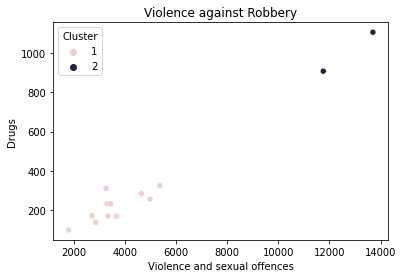

In [171]:
# Plot an example chart
sns.scatterplot(data = df_cluster, x = 'Violence and sexual offences', y = 'Drugs', hue = 'Cluster')
plt.title('Violence against Robbery');

We can see that there is a relationship between these two crimes and two points are well apart from the others

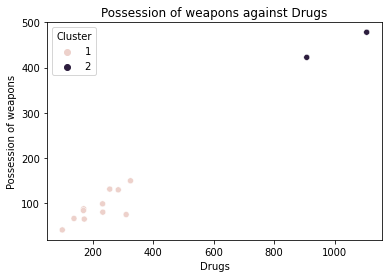

In [172]:
# Another example
sns.scatterplot(data = df_cluster, x = 'Drugs', y = 'Possession of weapons', hue = 'Cluster')
plt.title('Possession of weapons against Drugs');

In [173]:
# Extract the inertia values
inertias = []
mapping1 = {}

K = range(1, 10)

for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=42).fit(standard)
    
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = inertias[-1]

Inertia values:
1 : 182.00000000000003
2 : 42.769198507826836
3 : 30.95867509560805
4 : 24.483851451798646
5 : 19.88423276573916
6 : 15.188479953178751
7 : 10.911547536969994
8 : 7.629159291391008
9 : 4.369832494256025


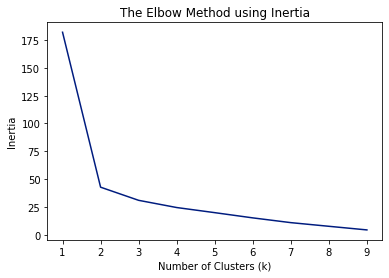

In [174]:
# Elbow chart
print("Inertia values:")
for key, val in mapping1.items():
    print(f'{key} : {val}')
    
# Plotting the graph of k versus Inertia
plt.plot(K, inertias)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

The connurbations of Portsmouth and Southampton are quite distinct from the other districts in Hampshire in terms of the level of crimes reported

## Build predictive model for crime based on economic indicators

In [177]:
# Select columns
data = crime_district_all[['Total Average', 'med_salary','unemp_rate','Pop_density']]
data = data.sample(frac = 1)

In [178]:
# Look at correlations
data.corr()

,Total Average,med_salary,unemp_rate,Pop_density
Total Average,1.000000,0.002413,0.787593,0.663775
med_salary,0.002413,1.000000,-0.179221,0.112264
unemp_rate,0.787593,-0.179221,1.000000,0.628492
Pop_density,0.663775,0.112264,0.628492,1.000000


There is a fairly strong correlations between the total average crimes and unemployment rate and population density, such that higher population density and unemployment rates are correlated with higher number of crimes. The correlation with median salary is weak negative, such that a higher salary is correlated with a lower crime rate.

We will have a look at the plots

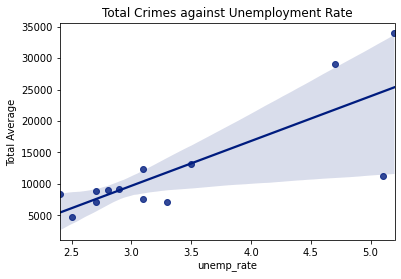

In [180]:
sns.regplot(data = data, x = 'unemp_rate', y = 'Total Average')
plt.title('Total Crimes against Unemployment Rate');

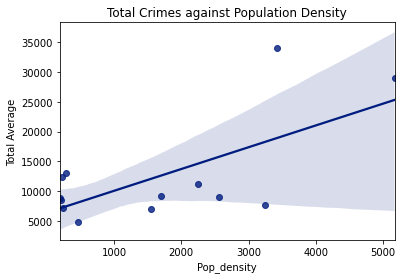

In [181]:
sns.regplot(data = data, x = 'Pop_density', y = 'Total Average')
plt.title('Total Crimes against Population Density');

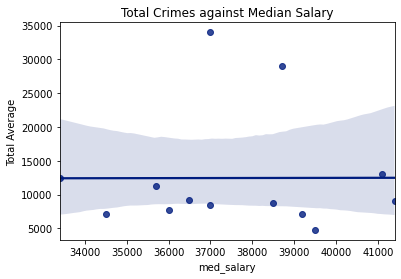

In [182]:
sns.regplot(data = data, x = 'med_salary', y = 'Total Average')
plt.title('Total Crimes against Median Salary');

We will try to build a model but recognising that we have very few data points so it is unlikely to be a good model. We would need data from across the UK to build something we could rely upon. However, it is interesting to have a look

In [183]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [186]:
# Define X and y
X = data.drop(columns = ['Total Average'],axis = 1)
y = data["Total Average"].values # This is the average of the years

In [187]:
# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, shuffle = True)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(10, 3) (3, 3) (10,) (3,)


In [201]:
y_train

array([ 9216.7,  4748.3, 28998.2,  7071.1,  8988.3,  7099.6, 11242.6,
        8477.3,  7652.7,  8801.3])

In [251]:
# Fit the model
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [252]:
# Print the coefficients and intercept
print(lr.coef_)
print(lr.intercept_)

[4.73654243e-01 2.97295221e+03 2.10679483e+00]
-20901.389866798338


In [253]:
# Get the r-squared score on the training data
lr.score(X_train,y_train)

0.6781098162961807

This is the percentage of the variation in crime which can be explained by the features of population density, median income and unemployment rate. The remaining percentage cannot be explained by our model.

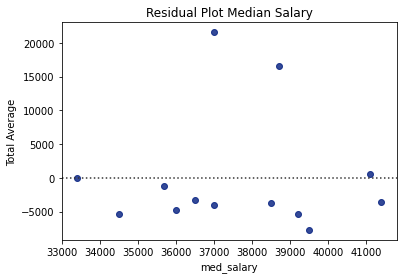

In [254]:
# Residual plot
sns.residplot(data['med_salary'],data['Total Average'])
plt.title('Residual Plot Median Salary');

We have two residuals way above the others, indicating the model underpredicted crime for those areas based on median salary

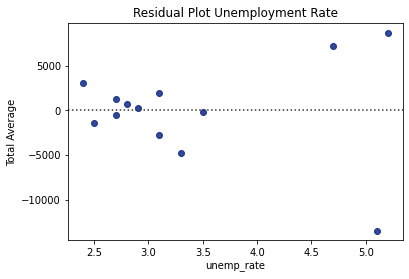

In [255]:
# Residual plot
sns.residplot(data['unemp_rate'],data['Total Average'])
plt.title('Residual Plot Unemployment Rate');

Comment as above

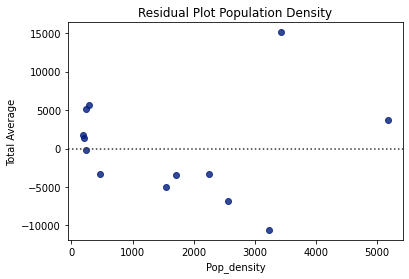

In [256]:
# Residual plot
sns.residplot(data['Pop_density'],data['Total Average'])
plt.title('Residual Plot Population Density');

Comment as above

It seems as if the two outliers (Portsmouth and Southampton) have average crimes a lot higher than the others and so the model is struggling to predict, especially since the training set is so small. Where these datapoints end up in the training or test set will affect the model.

In [257]:
y_pred = lr.predict(X_test)
y_pred

array([ 4626.54834267,  9586.74980668, 19289.10147879])

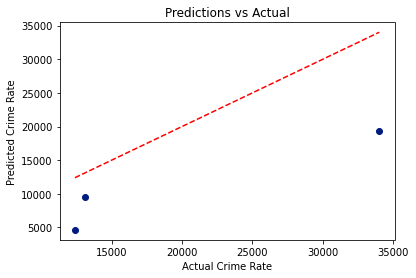

In [258]:
plt.scatter(y_test, y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # ideal line
plt.xlabel("Actual Crime Rate")
plt.ylabel("Predicted Crime Rate")
plt.title("Predictions vs Actual")
plt.show()

''

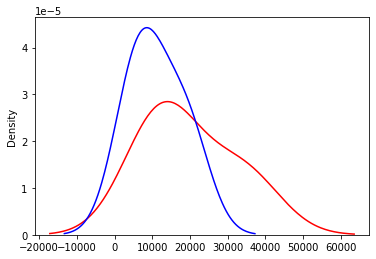

In [259]:
# Kde or distplot, y_pred against 
sns.distplot(y_test, hist = False, color = 'r', label = 'Actual Value')
sns.distplot(y_pred, hist = False, color = 'b', label = 'Predicted Value')
;

In [260]:
# Get mean squared error
mse = mean_squared_error(y_test, y_pred)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  96481044.0052176


In [261]:
# Get r-squared
r_squared = r2_score(y_test, y_pred)
print('The R-square value is: ', r_squared)

The R-square value is:  0.04125865963116959


This is a poor predictive model, explaining little more than we would expect by chance. A much bigger sample size would be needed to build a model and make reliable conclusions about crime levels being related to the features we identified and likely a whole host of different predictor variables would be needed making this quite a complicated model. We wouldn't want to drop the two cities as they are important and we dont have enough data to run as two separate models so we can try a robust linear regression

## Robust Linear Regression

In [262]:
from scipy.stats import zscore

# Find outliers - greater than 2
z_scores = zscore(data['Total Average'])
outliers = data[abs(z_scores) > 2]
print("Outlier towns:\n", outliers)

Outlier towns:
                Total Average  med_salary  unemp_rate  Pop_density
District Name                                                    
Southampton          34015.3       37000         5.2   3420.32967


Based on z-scores, Southampton is an outlier in the data.

Robust regression offers an alternative to traditional least squares regression by relaxing some of its strict assumptions. Unlike least squares, which can be heavily influenced by outliers, robust methods are designed to reduce their impact, allowing the model to better represent the majority of the data.

Outliers in least squares regression can disproportionately skew the model, pulling the regression line toward them and receiving more weight than they should. In contrast, robust regression down-weights these extreme values, making their residuals larger and more noticeable — which helps with identifying and diagnosing them more effectively.

In [263]:
from sklearn.linear_model import HuberRegressor

robust_model = HuberRegressor().fit(X_train, y_train)

# Print the coefficients and intercept
print(robust_model.coef_)
print(robust_model.intercept_)

[6.42032677e-02 1.42493239e+03 9.24926803e-01]
17.403602769846497


In [264]:
# Get the r-squared score on the training data
robust_model.score(X_train,y_train)

0.4095597527095004

In [265]:
y_pred2 = robust_model.predict(X_test)
y_pred2

array([ 6794.96489822,  7913.69019187, 12966.12752037])

In [268]:
# Calculate R-squared score
r2_robust = r2_score(y_test, y_pred2)

print(f"R-squared score Robust: {r2_robust:.3f}")

R-squared score Robust: -0.660


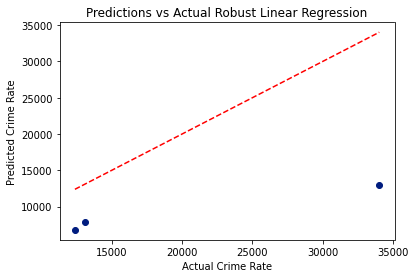

In [269]:
plt.scatter(y_test, y_pred2)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # ideal line
plt.xlabel("Actual Crime Rate")
plt.ylabel("Predicted Crime Rate")
plt.title("Predictions vs Actual Robust Linear Regression")
plt.show()

This hasnt improved the results

## Exclude Southampton

In [271]:
# Rerun linear regression without Southampton
data_no_outliers = data[abs(z_scores) <= 2]

X_no = data_no_outliers[['med_salary', 'unemp_rate', 'Pop_density']]
y_no = data_no_outliers['Total Average']

model_clean = LinearRegression().fit(X_no, y_no)
results = model_clean.predict(X_no)
print("Clean model R²:", r2_score(y_no, results))

Clean model R²: 0.5724168801796363


The R2 has not improved after excluding Southampton

In [272]:
# Predict crime rates for the test set using the trained model
y_test_pred = model_clean.predict(X_test)

# Print or inspect the predictions
print(y_test_pred)

[ 7174.79741042 10745.7411395  20236.31783444]


In [275]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_test_pred, squared=False)
r2_exclude = r2_score(y_test, y_test_pred)

print(f"Test RMSE: {rmse:.2f}")
print(f"Test R²: {r2_exclude:.3f}")


Test RMSE: 8613.55
Test R²: 0.263


We have improved the results slightly on the model including Southampton but not much. We can conclude that there are many other factors involved and not just the simple model with have built including population density, unemployment rate and median income